In [3]:
# K-means: a type of unsupervised clustering algorithm
        # technically NOT a clustering algo, but rather, a partitioning algo, since ALL points are assigned to a cluster.
    # each cluster defined by a centroid, which is the mean of the cluster
        # hence the name k-means
    # k is set before the model is built. You might set it to 5 if you want to divide the data into 5 groups

In [5]:
import pandas as pd
import numpy as np

%matplotlib inline
import plotly.graph_objects as go

from sklearn.cluster import KMeans

In [7]:
# read in a jpg 
img = plt.imread('/Users/micahevalt/Downloads/using_kmeans_for_color_compression_tulips_photo.jpg')

(320, 240, 3)


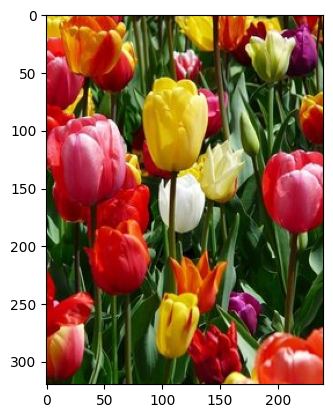

In [11]:
# display the photo and its shape (in pixels)
print(img.shape)
plt.imshow(img)

In [13]:
# flatten img so each row represents a single pixel
img_flat = img.reshape(img.shape[0]*img.shape[1], 3)
img_flat[:5, :]

array([[211, 197,  38],
       [199, 181,  21],
       [178, 154,   0],
       [185, 152,   0],
       [184, 145,   0]], dtype=uint8)

In [14]:
print(img_flat.shape)
print(320*240)

(76800, 3)
76800


In [15]:
#^ a dataframe consisting of number of entries equal to the number of pixels in the image.
    # each entry is a list of 3 values, which correspond to the red, green, and blue value per pixel, respectively

In [16]:
# turn data above into a dataframe
df_img_flat = pd.DataFrame(img_flat, columns = ['r','g','b'])
df_img_flat.head(5)

,r,g,b
0,211,197,38
1,199,181,21
2,178,154,0
3,185,152,0
4,184,145,0


In [20]:
# create 3D plot where each pixel in the image is displayed in its actual color
trace = go.Scatter3d(x = df_img_flat.r,
                     y = df_img_flat.g,
                     z = df_img_flat.b,
                     mode = 'markers',
                     marker = dict(size = 1,
                                   color = ['rgb({},{},{})'.format(r,g,b) for r,g,b
                                            in zip(df_img_flat.r.values,
                                                   df_img_flat.g.values,
                                                   df_img_flat.b.values)],
                                   opacity = 0.5))

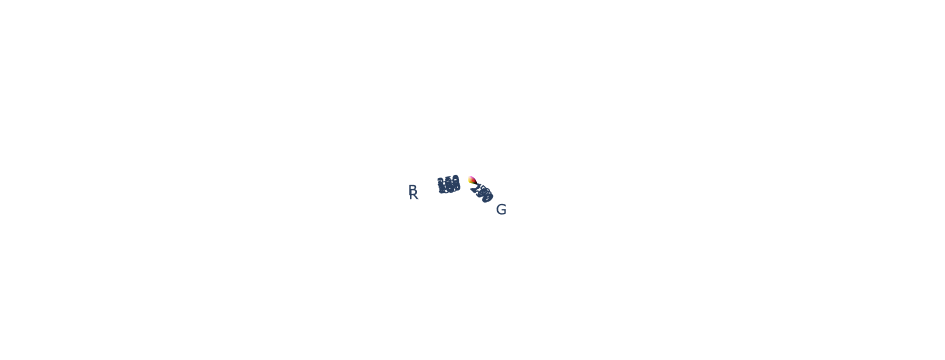

In [28]:
data = [trace]
layout = go.Layout(margin = dict(l=0,
                                 r=0,
                                 b=0,
                                 t=0),
                  )
fig = go.Figure(data = data, layout = layout)
fig.update_layout(scene = dict(
    xaxis_title = 'R',
    yaxis_title = 'G',
    zaxis_title = 'B'),
                 )
fig.show()

In [30]:
# still kind of trying to piece together how this was made, but holy hell, I didn't know you could do this in Python
    # the yellow corner is high values for red and green, low for blue. 
    # the most represented colors in the graph are the most abundant in the photo. 
# we can train a K-means model on this data.

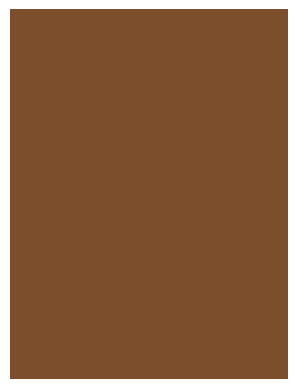

In [43]:
# Experiment time: what would happen if we built a K-means model with a single centroid (k=1) and replaced each 
    # pixel in the photo with the RGB value of that centroid?

kmeans1 = KMeans(n_clusters = 1, random_state = 42).fit(img_flat)

# copy 'img_flat' so we can mess with it while retaining the OG

img_flat1 = img_flat.copy()

# replace each row in the copy with its closest cluster center

for i in np.unique(kmeans1.labels_):
    img_flat1[kmeans1.labels_==i,:] = kmeans1.cluster_centers_[i]

# reshape the data back to (640, 480, 3)

img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');

In [45]:
# What we did:
    # 1) Randomly placed centroid in the colorspace
    # 2) Assigned each point to its nearest centroid (of which there was a total of 1)
    # 3) Updated the centroid's location to the mean location of all its points (of which there was 1)
    # 4) Repeat until the model converges (which took only 1 iteration).
    # 5) Updated each pixel's RGB values to be the same as the centroid's.
# We can verify this is the average color by calculating in manually:
column_means = img_flat.mean(axis=0)
column_means

array([125.60802083,  78.90632813,  43.45473958])

In [46]:
kmeans1.cluster_centers_

array([[125.60802083,  78.90632812,  43.45473958]])

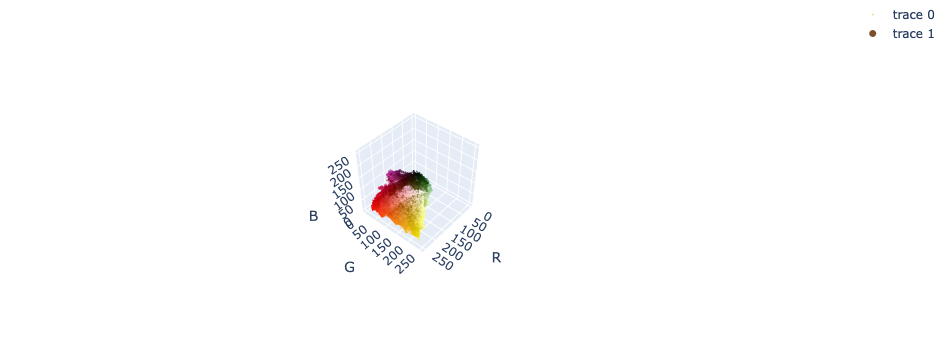

In [51]:
# let's add the centroid to the image
fig = go.Figure(data = data, layout = layout) # <-- starting off where we were earlier
centroid = kmeans1.cluster_centers_[0].tolist()
# added the RGB values of the cluster to a list, which we can index to specify centroid values below!
fig.add_trace(
    go.Scatter3d(x = [centroid[0]],
                 y = [centroid[1]],
                 z = [centroid[2]],
                 mode = 'markers',
                 marker = dict(size = 7,
                               color = ['rgb(125.79706706, 78.8178776, 42.58090169)'],
                               opacity = 1))
)
#^ Adding a "trace" is like adding a layer, it seems? e.g. A layer with a single point, our centroid?

fig.update_layout(scene = dict(
    xaxis_title = 'R',
    yaxis_title = 'G',
    zaxis_title = 'B'),
                 )
fig.show()

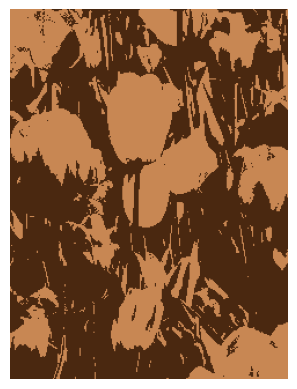

In [71]:
# COOL! Let's switch it up to k = 2, 3, etc. 

kmeans2 = KMeans(n_clusters = 2, random_state = 42).fit(img_flat)

for i in np.unique(kmeans2.labels_):
    img_flat1[kmeans2.labels_==i,:] = kmeans2.cluster_centers_[i]

img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');

In [61]:
# So it's still brown, but with k = 2 we now have light brown and dark brown.

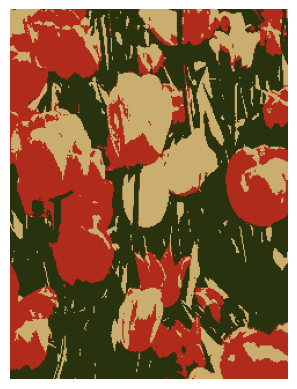

In [62]:
kmeans3 = KMeans(n_clusters = 3, random_state = 42).fit(img_flat)

for i in np.unique(kmeans3.labels_):
    img_flat1[kmeans3.labels_==i,:] = kmeans3.cluster_centers_[i]

img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');
# K = 3

In [63]:
# with K = 3, we still have a light brown, but the dark brown has been differentiated between dark green and red.

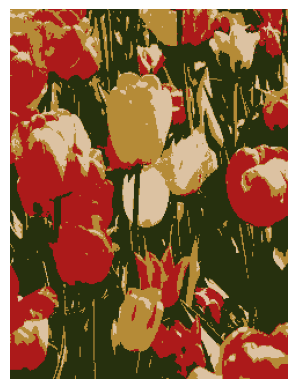

In [65]:
kmeans4 = KMeans(n_clusters = 4, random_state = 42).fit(img_flat)

for i in np.unique(kmeans4.labels_):
    img_flat1[kmeans4.labels_==i,:] = kmeans4.cluster_centers_[i]

img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');
# K = 4

In [66]:
# With k = 4, we still have the green/red, but now the light-brown has differentiated to beige and gold.

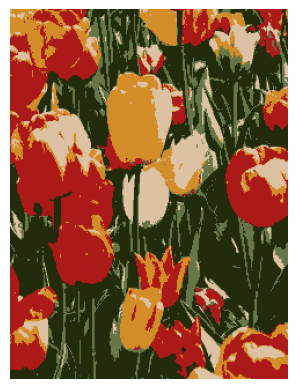

In [77]:
kmeans5 = KMeans(n_clusters = 5, random_state = 42).fit(img_flat)

for i in np.unique(kmeans5.labels_):
    img_flat1[kmeans5.labels_==i,:] = kmeans5.cluster_centers_[i]

img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');
# K = 5

In [68]:
# with k = 5, green has differentiated between light/dark and the gold is becoming more yellowish.

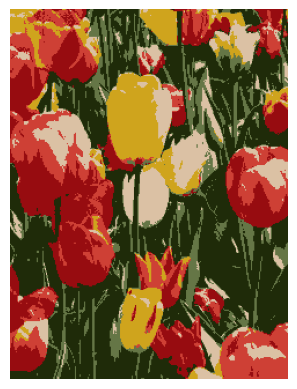

In [76]:
kmeans6 = KMeans(n_clusters = 6, random_state = 42).fit(img_flat)

for i in np.unique(kmeans6.labels_):
    img_flat1[kmeans6.labels_==i,:] = kmeans6.cluster_centers_[i]

img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');
# K = 6

In [72]:
# with k = 6, red has differentiated.

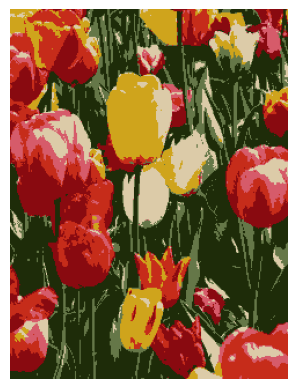

In [75]:
kmeans7 = KMeans(n_clusters = 7, random_state = 42).fit(img_flat)

for i in np.unique(kmeans7.labels_):
    img_flat1[kmeans7.labels_==i,:] = kmeans7.cluster_centers_[i]

img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');
# K = 7

In [78]:
# red differentiates further to create pink.
# this is really cool.

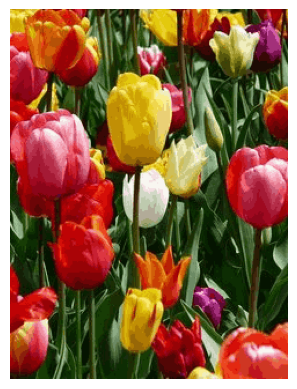

In [98]:
kmeans100 = KMeans(n_clusters = 100, random_state = 42).fit(img_flat)

for i in np.unique(kmeans100.labels_):
    img_flat1[kmeans100.labels_==i,:] = kmeans100.cluster_centers_[i]

img1 = img_flat1.reshape(img.shape)

k100=plt.imshow(img1)
plt.axis('off');
# K = 100

In [92]:
import matplotlib.pyplot as plt
plt.imsave('k100_tulips.jpg', img)

In [94]:
# almost indistinguishable from the OG image at k = 100
    # "This is a visual example of something that happens with all clustering models, even if the data is not an
        # image you can see. As you group the data into more and more clusters, additional clusters beyond a
        # certain point contribute less and less to your understanding of the data."

In [100]:
# END OF LAB!

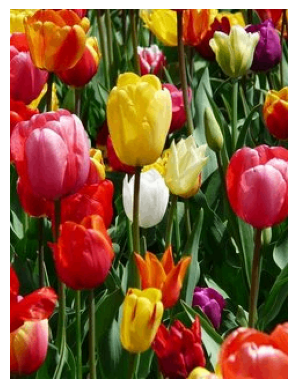

In [99]:
kmeans500 = KMeans(n_clusters = 500, random_state = 42).fit(img_flat)

for i in np.unique(kmeans500.labels_):
    img_flat1[kmeans500.labels_==i,:] = kmeans500.cluster_centers_[i]

img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');

In [ ]:
# sometimes K-means doesn't cluster data how you'd like it to, since it minimizes intercluster variance
        # ( by minimizing distance b/t point and centroid), and therefore prefers round (circular) clusters.
    # Here are some alternatives:
        # DBSCAN (density-based spatial clustering of applications with noise).
            # instead of minimizing intercluster variance, it searches for continuous regions of high density.
        # Agglomerative clustering